In [1]:
import cv2
import numpy as np
from ultralytics import YOLO  # YOLO V8 (Ultralytics)

def find_common_region(frames):
    """計算所有對齊影格的共同可視區域，避免黑色邊框。"""
    h, w = frames[0].shape[:2]
    mask = np.ones((h, w), dtype=np.uint8) * 255  # 白色遮罩 (255 代表可用區域)

    for frame in frames:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        _, binary = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)  # 找出非黑色區域
        mask = cv2.bitwise_and(mask, binary)  # 取得所有影格的交集區域

    # 找出最小邊界框 (bounding box)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    x, y, w, h = cv2.boundingRect(contours[0])  # 取得最大共視範圍
    return x, y, w, h

def extract_fixed_frames(cap, target_frames=240):
    """
    從影片中抽取指定數量 target_frames 的影格，
    若影片總影格較多，則以等距抽取 (sample_interval)。
    """
    frames = []
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    sample_interval = max(1, total_frames // target_frames)

    frame_idx = 0
    frame_count = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret or frame_count >= target_frames:
            break
        if frame_idx % sample_interval == 0:
            frames.append(frame)
            frame_count += 1
        frame_idx += 1

    return frames

def create_car_masked_frame(frame, model, car_class_ids=None):
    """
    透過 YOLO 模型偵測影格中的「車輛」，將車輛區域塗黑 (或其他顏色)。
    - frame: BGR 格式的單張影格
    - model: 已載入的 YOLO 模型
    - car_class_ids: 需要遮罩的 class id list (例如: [2] 表示 'car')
      注意這要和你的訓練模型標籤一致。
    """
    if car_class_ids is None:
        car_class_ids = [2]  # 通常 COCO 中 "car" 是 class id = 2, 可依據自己的模型改

    results = model(frame, verbose=False)  # 執行推論 (verbose=False 可避免過多輸出)
    # YOLO v8 推論結果，每張圖會有一個 results
    # result.boxes 內包含( x1, y1, x2, y2, conf, cls )...

    masked_frame = frame.copy()

    for result in results:
        boxes = result.boxes
        for box in boxes:
            cls = int(box.cls[0].item())  # 取得 class id
            if cls in car_class_ids:
                x1, y1, x2, y2 = box.xyxy[0]  # xyxy 是浮點型, 需要轉成 int
                x1, y1, x2, y2 = map(int, (x1, y1, x2, y2))
                # 將偵測到的車輛區域塗成黑色 (BGR = 0,0,0)
                cv2.rectangle(masked_frame, (x1, y1), (x2, y2), (0, 0, 0), -1)

    return masked_frame

def align_images_with_ransac(base_frame, frames_masked, frames_original):
    """
    用 ORB + RANSAC (Homography) 對齊影像:
    - base_frame: 對齊的參考影格 (原圖亦可，但建議保留基準一致)
    - frames_masked: 遮罩後的影格清單 (方便 ORB 避開動態物件)
    - frames_original: 與 frames_masked 對應的原始影格 (最後真正輸出)
    """
    aligned_frames = []
    orb = cv2.ORB_create()

    # 先對「基準影格」做 ORB
    base_gray = cv2.cvtColor(base_frame, cv2.COLOR_BGR2GRAY)
    kp1, des1 = orb.detectAndCompute(base_gray, None)

    for i, masked_frame in enumerate(frames_masked):
        frame_gray = cv2.cvtColor(masked_frame, cv2.COLOR_BGR2GRAY)
        kp2, des2 = orb.detectAndCompute(frame_gray, None)

        # 防止 ORB descriptor 為 None
        if des1 is None or des2 is None or len(des1) == 0 or len(des2) == 0:
            # 若出現無法偵測特徵的情況，就不做對齊
            aligned_frames.append(frames_original[i])
            continue

        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        matches = bf.match(des1, des2)
        matches = sorted(matches, key=lambda x: x.distance)

        # 設一個閾值，若特徵點過少，就不做 Homography
        if len(matches) > 10:
            src_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
            dst_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
            H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
            if H is not None:
                h, w = base_frame.shape[:2]
                aligned_frame = cv2.warpPerspective(frames_original[i], H, (w, h))
                aligned_frames.append(aligned_frame)
                continue

        # 若 Homography 失敗或特徵不夠，就直接使用原圖
        aligned_frames.append(frames_original[i])

    return aligned_frames

def extract_fixed_frames_and_align(input_video, output_video, target_frames=240):
    # 讀取影片
    cap = cv2.VideoCapture(input_video)
    if not cap.isOpened():
        print("Error: 無法開啟影片")
        return

    # 第 1 步：抽取指定數量影格 (target_frames)
    frames_original = extract_fixed_frames(cap, target_frames)
    cap.release()
    
    if len(frames_original) == 0:
        raise ValueError("未能讀取任何影格，請檢查影片路徑與格式。")

    # 載入 YOLO 模型 (車輛偵測)
    model = YOLO(r'E:\論文\期刊\code\YOLO\satellite2_train.pt')

    # 第 2 步：為每個影格建立「車輛遮罩版」
    frames_masked = []
    for frame in frames_original:
        masked = create_car_masked_frame(frame, model, car_class_ids=[2])
        frames_masked.append(masked)

    # 第 3 步：以第一幀 (原始) 當作對齊基準
    base_frame = frames_original[0]

    # 第 4 步：對所有影格做影像對齊 (使用「遮罩影格」做特徵匹配，
    #         但最後套用 Homography 到「原始影格」)
    aligned_frames = align_images_with_ransac(base_frame, frames_masked, frames_original)

    # 第 5 步：計算最小可視區域 (去除黑邊)
    x, y, w, h = find_common_region(aligned_frames)
    cropped_frames = [frame[y:y+h, x:x+w] for frame in aligned_frames]

    # 第 6 步：輸出影片
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    fps = 30  # 自行調整輸出影片 FPS
    out = cv2.VideoWriter(output_video, fourcc, fps, (w, h))

    for frame in cropped_frames:
        out.write(frame)
    out.release()

    print(f"✅ 影片儲存成功！輸出路徑: {output_video}")

# 測試程式
if __name__ == "__main__":
    input_video_path = r"E:/論文/期刊/code/240fps/tests_240fps.mp4"
    output_video_path = r"E:/論文/期刊/code/aligned_output/aligned_tests_cropped_output_addYOLO.mp4"
    extract_fixed_frames_and_align(input_video_path, output_video_path, target_frames=240)


✅ 影片儲存成功！輸出路徑: E:/論文/期刊/code/aligned_output/aligned_tests_cropped_output_addYOLO.mp4


In [ ]:
import cv2
import numpy as np

def find_common_region(frames):
    """ 計算所有對齊影格的共同可視區域，避免黑色邊框 """
    h, w = frames[0].shape[:2]
    mask = np.ones((h, w), dtype=np.uint8) * 255  # 白色遮罩 (255 代表可用區域)

    for frame in frames:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        _, binary = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)  # 找出非黑色區域
        mask = cv2.bitwise_and(mask, binary)  # 取得所有影格的交集區域

    # 找出最小邊界框 (bounding box)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    x, y, w, h = cv2.boundingRect(contours[0])  # 取得最大共視範圍

    return x, y, w, h

def extract_fixed_frames_and_align(input_video, output_video, target_frames=240):
    # 讀取影片
    cap = cv2.VideoCapture(input_video)
    
    # 確保影片能夠正確開啟
    if not cap.isOpened():
        print("Error: 無法開啟影片")
        return
    
    # 取得影片基本資訊
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    sample_interval = max(1, total_frames // target_frames)

    frames = []
    frame_idx = 0
    frame_count = 0

    # 讀取影格
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret or frame_count >= target_frames:
            break
        if frame_idx % sample_interval == 0:
            frames.append(frame)
            frame_count += 1
        frame_idx += 1

    cap.release()

    if len(frames) == 0:
        raise ValueError("未能讀取任何影格，請檢查影片路徑與格式。")

    frames = np.array(frames, dtype=np.uint8)  # 儲存影格

    # **RANSAC + Homography 影像對齊**
    def align_images(frames):
        aligned_frames = []
        base_frame = frames[0]  # 以第一幀為基準
        orb = cv2.ORB_create()

        for frame in frames:
            kp1, des1 = orb.detectAndCompute(cv2.cvtColor(base_frame, cv2.COLOR_BGR2GRAY), None)
            kp2, des2 = orb.detectAndCompute(cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY), None)
            
            if des1 is None or des2 is None or len(des1) == 0 or len(des2) == 0:
                aligned_frames.append(frame)
                continue
            
            bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
            matches = bf.match(des1, des2)
            matches = sorted(matches, key=lambda x: x.distance)
            
            if len(matches) > 10:
                src_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
                dst_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
                H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
                aligned_frame = cv2.warpPerspective(frame, H, (frame.shape[1], frame.shape[0]))
                aligned_frames.append(aligned_frame)
            else:
                aligned_frames.append(frame)

        return np.array(aligned_frames, dtype=np.uint8)

    aligned_frames = align_images(frames)

    # **計算最小可視區域 (去除黑邊)**
    x, y, w, h = find_common_region(aligned_frames)
    cropped_frames = [frame[y:y+h, x:x+w] for frame in aligned_frames]  # 裁剪所有影格

    # **輸出影片**
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    fps = 30  # 設定輸出影片 FPS
    out = cv2.VideoWriter(output_video, fourcc, fps, (w, h))

    for frame in cropped_frames:
        out.write(frame)

    out.release()
    print(f"✅ 影片儲存成功！輸出路徑: {output_video}")

# 測試程式
input_video_path = r"E:/論文/期刊/code/240fps/tests_240fps.mp4"
output_video_path = r"E:/論文/期刊/code/aligned_output/aligned_tests_cropped_output.mp4"

extract_fixed_frames_and_align(input_video_path, output_video_path, target_frames=240)


✅ 影片儲存成功！輸出路徑: E:/論文/期刊/code/aligned_output/aligned_test2_cropped_output.mp4


In [ ]:
import cv2
import numpy as np


# 讀取影片
video_path = r"E:/論文/期刊/code/240fps/test3_240fps.mp4"  # 請替換為你的影片路徑
cap = cv2.VideoCapture(video_path)

frames = []
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
sample_interval = max(1, total_frames // 240)
frame_idx = 0
frame_count = 0
max_frames = 240

while True:
    if frame_idx >= total_frames:
        break
    if frame_count >= max_frames:
        break
    ret, frame = cap.read()
    if not ret:
        break
    if frame_idx % sample_interval == 0:
        frames.append(frame)
    frame_idx += 1
    frame_count += 1  # 保留原始 BGR 影像
cap.release()

if len(frames) == 0:
    raise ValueError("未能讀取任何影格，請檢查影片路徑與格式。")

frames = np.array(frames, dtype=np.uint8)  # 儲存影格，不進行平均化

# **RANSAC + Homography 影像對齊**
def align_images(frames):
    aligned_frames = []
    base_frame = frames[0]  # 以第一幀為基準
    orb = cv2.ORB_create()

    for frame in frames:
        kp1, des1 = orb.detectAndCompute(cv2.cvtColor(base_frame, cv2.COLOR_BGR2GRAY), None)
        kp2, des2 = orb.detectAndCompute(cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY), None)
        
        if des1 is None or des2 is None or len(des1) == 0 or len(des2) == 0:
            aligned_frames.append(frame)
            continue
        
        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        matches = bf.match(des1, des2)
        matches = sorted(matches, key=lambda x: x.distance)
        
        if len(matches) > 10:
            src_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
            dst_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
            H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
            aligned_frame = cv2.warpPerspective(frame, H, (frame.shape[1], frame.shape[0]))
            aligned_frames.append(aligned_frame)
        else:
            aligned_frames.append(frame)
        
    return np.array(aligned_frames, dtype=np.uint8)

aligned_frames = align_images(frames)

# **將對齊後的影格存成影片**
output_video_path = r"E:/論文/期刊/code/aligned_output/aligned_test3_output.mp4"  # 修改為你想存檔的位置
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # 使用 MP4 格式
fps = 30  # 設定輸出影片 FPS
frame_height, frame_width, _ = aligned_frames[0].shape
out = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

for frame in aligned_frames:
    out.write(frame)

out.release()
print(f"✅ 影片儲存成功！輸出路徑: {output_video_path}")


✅ 影片儲存成功！輸出路徑: E:/論文/期刊/code/aligned_output/aligned_test3_output.mp4


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 讀取影片
video_path = r"E:\論文\期刊\code\images\loc_demo3.mp4"  # 替換為你的影片路徑
cap = cv2.VideoCapture(video_path)

frames = []
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
sample_interval = max(1, total_frames // 240)
frame_idx = 0
frame_count = 0
max_frames = 240

while True:
    if frame_idx >= total_frames or frame_count >= max_frames:
        break
    ret, frame = cap.read()
    if not ret:
        break
    if frame_idx % sample_interval == 0:
        frames.append(frame)
    frame_idx += 1
    frame_count += 1

cap.release()

if len(frames) == 0:
    raise ValueError("未能讀取任何影格，請檢查影片路徑與格式。")

frames = np.array(frames, dtype=np.float32)

# 方法 1: 直接進行影像平均化（未對齊）
average_frame = np.mean(frames, axis=0).astype(np.uint8)

# 方法 2: RANSAC + Homography 對齊
def align_images_ransac(frames):
    aligned_frames = []
    base_frame = frames[0].astype(np.uint8)
    orb = cv2.ORB_create()

    for frame in frames:
        frame_uint8 = frame.astype(np.uint8)
        kp1, des1 = orb.detectAndCompute(cv2.cvtColor(base_frame, cv2.COLOR_BGR2GRAY), None)
        kp2, des2 = orb.detectAndCompute(cv2.cvtColor(frame_uint8, cv2.COLOR_BGR2GRAY), None)

        if des1 is None or des2 is None or len(des1) == 0 or len(des2) == 0:
            aligned_frames.append(frame_uint8)
            continue

        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        matches = bf.match(des1, des2)
        matches = sorted(matches, key=lambda x: x.distance)

        if len(matches) > 10:
            src_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
            dst_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
            H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
            aligned_frame = cv2.warpPerspective(frame_uint8, H, (frame.shape[1], frame.shape[0]))
            aligned_frames.append(aligned_frame)
        else:
            aligned_frames.append(frame_uint8)

    return np.array(aligned_frames, dtype=np.float32)

# 方法 3: ORB + Affine Transform 對齊
def align_images_affine(frames):
    aligned_frames = []
    base_frame = frames[0].astype(np.uint8)
    orb = cv2.ORB_create()

    for frame in frames:
        frame_uint8 = frame.astype(np.uint8)
        kp1, des1 = orb.detectAndCompute(cv2.cvtColor(base_frame, cv2.COLOR_BGR2GRAY), None)
        kp2, des2 = orb.detectAndCompute(cv2.cvtColor(frame_uint8, cv2.COLOR_BGR2GRAY), None)

        if des1 is None or des2 is None or len(des1) == 0 or len(des2) == 0:
            aligned_frames.append(frame_uint8)
            continue

        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        matches = bf.match(des1, des2)
        matches = sorted(matches, key=lambda x: x.distance)

        if len(matches) > 3:
            src_pts = np.float32([kp2[m.trainIdx].pt for m in matches[:3]]).reshape(-1, 2)
            dst_pts = np.float32([kp1[m.queryIdx].pt for m in matches[:3]]).reshape(-1, 2)
            M = cv2.getAffineTransform(src_pts, dst_pts)
            aligned_frame = cv2.warpAffine(frame_uint8, M, (frame.shape[1], frame.shape[0]))
            aligned_frames.append(aligned_frame)
        else:
            aligned_frames.append(frame_uint8)

    return np.array(aligned_frames, dtype=np.float32)

# 平均化時忽略黑色區域
def average_frames_ignore_black(frames):
    masks = np.any(frames != [0, 0, 0], axis=-1).astype(np.uint8)  # 每幀的非黑色遮罩
    valid_mask = np.all(masks, axis=0)  # 所有 frame 都非黑的 pixel 為 True

    # 建立加總與計數器
    sum_image = np.zeros_like(frames[0], dtype=np.float32)
    count_image = np.zeros_like(frames[0], dtype=np.float32)

    for frame in frames:
        mask = np.any(frame != [0, 0, 0], axis=-1).astype(np.float32)[:, :, np.newaxis]
        sum_image += frame * mask
        count_image += mask

    count_image[count_image == 0] = 1  # 避免除以 0
    avg = (sum_image / count_image).astype(np.uint8)
    return avg

# 執行對齊與平均
aligned_frames_ransac = align_images_ransac(frames)
aligned_average_frame_ransac = average_frames_ignore_black(aligned_frames_ransac)

aligned_frames_affine = align_images_affine(frames)
aligned_average_frame_affine = average_frames_ignore_black(aligned_frames_affine)

# 顯示結果
fig, axes = plt.subplots(1, 3, figsize=(15, 5), dpi=300)

axes[0].imshow(cv2.cvtColor(average_frame, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original Average Background")
axes[0].axis("off")

axes[1].imshow(cv2.cvtColor(aligned_average_frame_ransac, cv2.COLOR_BGR2RGB))
axes[1].set_title("RANSAC + Homography (Ignore Black)")
axes[1].axis("off")

axes[2].imshow(cv2.cvtColor(aligned_average_frame_affine, cv2.COLOR_BGR2RGB))
axes[2].set_title("Affine Transform (Ignore Black)")
axes[2].axis("off")

plt.tight_layout()
plt.show()


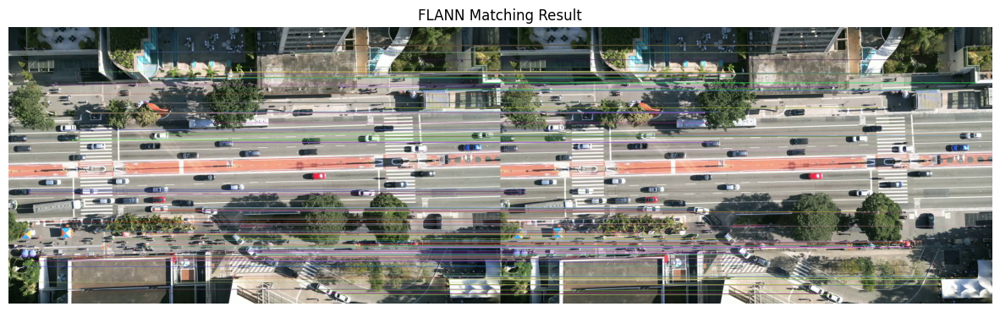

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 讀取影片
video_path = r"E:\論文\期刊\code\240fps\test2_240fps.mp4"  # 替換為你的影片路徑
cap = cv2.VideoCapture(video_path)

frames = []
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
sample_interval = max(1, total_frames // 240)
frame_idx = 0
frame_count = 0
max_frames = 2  # 只取兩幀來進行特徵匹配

while True:
    if frame_idx >= total_frames or frame_count >= max_frames:
        break
    ret, frame = cap.read()
    if not ret:
        break
    if frame_idx % sample_interval == 0:
        frames.append(frame)
    frame_idx += 1
    frame_count += 1

cap.release()

if len(frames) < 2:
    raise ValueError("未能讀取足夠的影格，請檢查影片路徑與格式。")

# 轉成灰階
img1 = cv2.cvtColor(frames[0], cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(frames[1], cv2.COLOR_BGR2GRAY)

# 創建 ORB 偵測器
orb = cv2.ORB_create()

# 找到特徵點和描述符
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# 使用 FLANN 匹配器
index_params = dict(algorithm=6,  # FLANN 的 LSH 算法 (6 = FLANN_INDEX_LSH)
                    table_number=6,  # LSH 參數
                    key_size=12,     # LSH 參數
                    multi_probe_level=1)  # LSH 參數
search_params = dict(checks=50)  # 檢查次數

flann = cv2.FlannBasedMatcher(index_params, search_params)

# 使用 KNN 進行匹配
matches = flann.knnMatch(des1, des2, k=2)

# 過濾出好的匹配點
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)

# 在特徵點位置畫圓點
for match in good_matches:
    # 取得特徵點的座標
    pt1 = tuple(map(int, kp1[match.queryIdx].pt))
    pt2 = tuple(map(int, kp2[match.trainIdx].pt))
    
    # 在原始影像上畫出圓點
    cv2.circle(frames[0], pt1, 5, (0, 255, 0), -1)  # 綠色圓點
    cv2.circle(frames[1], pt2, 5, (0, 255, 0), -1)  # 綠色圓點

# 繪製匹配結果
match_img = cv2.drawMatches(frames[0], kp1, frames[1], kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# 顯示匹配結果
plt.figure(figsize=(15, 7))
plt.imshow(cv2.cvtColor(match_img, cv2.COLOR_BGR2RGB))
plt.title('FLANN Matching Result with Keypoints')
plt.axis('off')
plt.show()


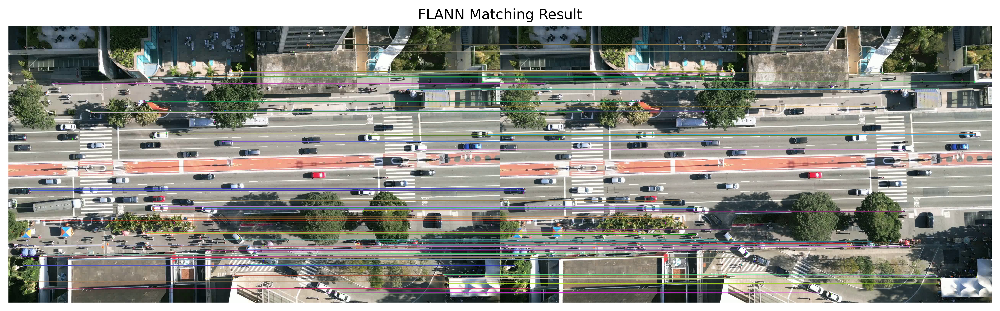

In [4]:
# 顯示匹配結果
plt.figure(figsize=(15, 7),dpi=500)
plt.imshow(cv2.cvtColor(match_img, cv2.COLOR_BGR2RGB))
plt.title('FLANN Matching Result')
plt.axis('off')
plt.show()